<a href="https://colab.research.google.com/github/Rohith-Rongali/cv-session/blob/main/assign2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
!git clone https://github.com/Rohith-Rongali/SummerSchool-Assignment
%cd SummerSchool-Assignment/rohith_ee19b114/assign2_ee19b114/media/


Cloning into 'SummerSchool-Assignment'...
remote: Enumerating objects: 385, done.
remote: Counting objects: 100% (157/157), done.
remote: Compressing objects: 100% (105/105), done.
remote: Total 385 (delta 104), reused 62 (delta 52), pack-reused 228
Receiving objects: 100% (385/385), 75.44 MiB | 26.13 MiB/s, done.
Resolving deltas: 100% (137/137), done.
/content/SummerSchool-Assignment/rohith_ee19b114/assign2_ee19b114/media/SummerSchool-Assignment/rohith_ee19b114/assign2_ee19b114/media


Task 1: Edge Detection using Difference of Gaussians

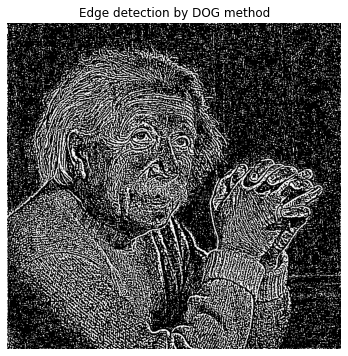

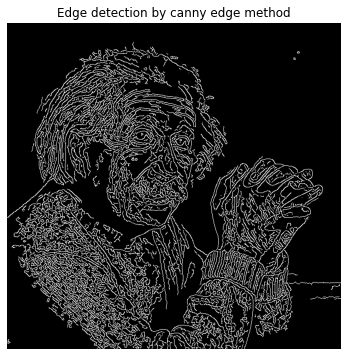

In [4]:
import cv2
import numpy as np
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
img = cv2.imread('einstein.jpg')

img_dog = cv2.GaussianBlur(img,(5,5),1.4,1.4)-cv2.GaussianBlur(img,(9,9),1,1)  # difference of gaussian blurs
img_canny = cv2.Canny(cv2.GaussianBlur(img,(5,5),1.4,1.4),20,50)

plt.figure(figsize=(9,6))
plt.axis("off")
plt.title("Edge detection by DOG method")
plt.imshow(img_dog)


plt.figure(figsize=(9,6))
plt.axis("off")
plt.title("Edge detection by canny edge method")
plt.imshow(img_canny,cmap='gray')
                                                            

Task 2: Template Matching using Histograms

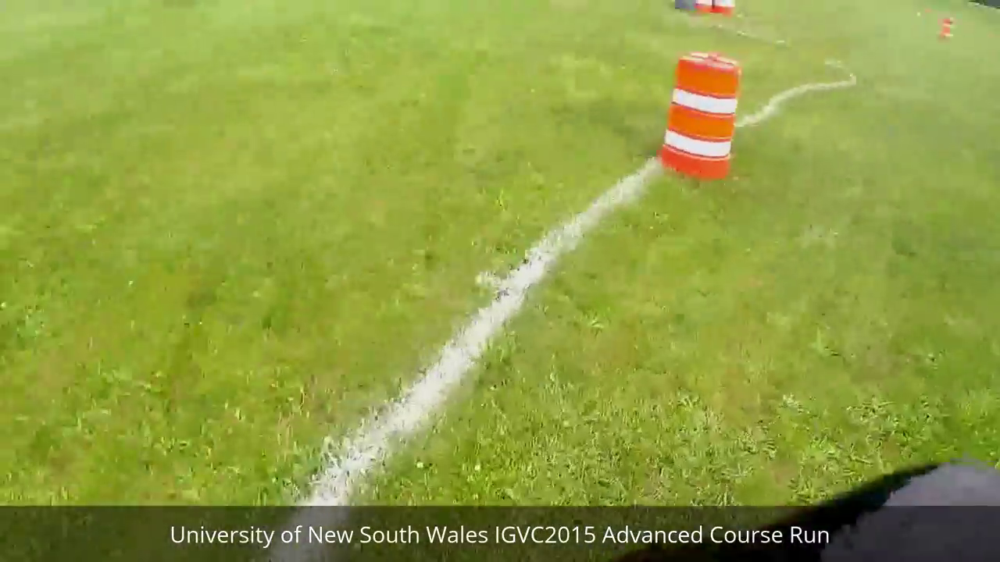

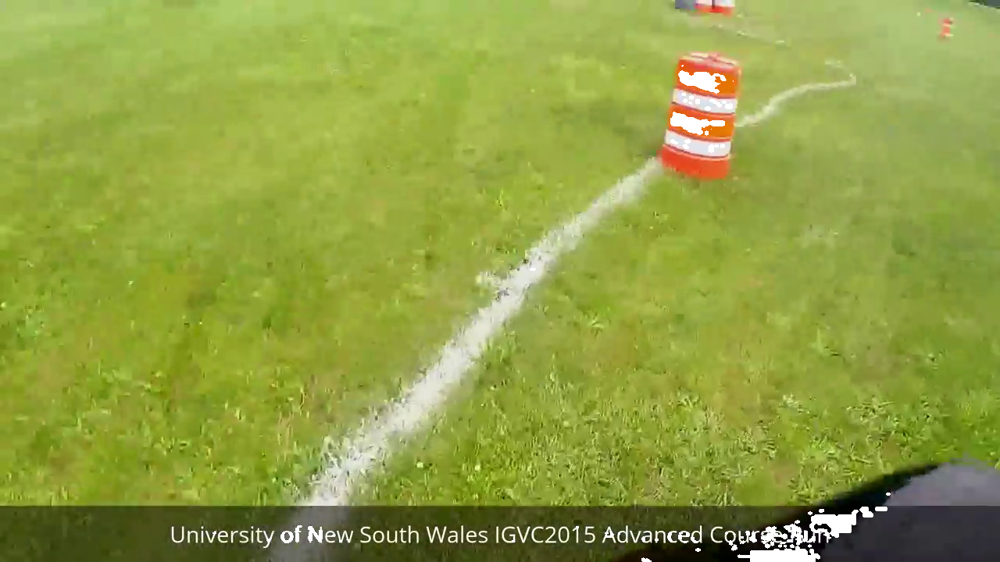

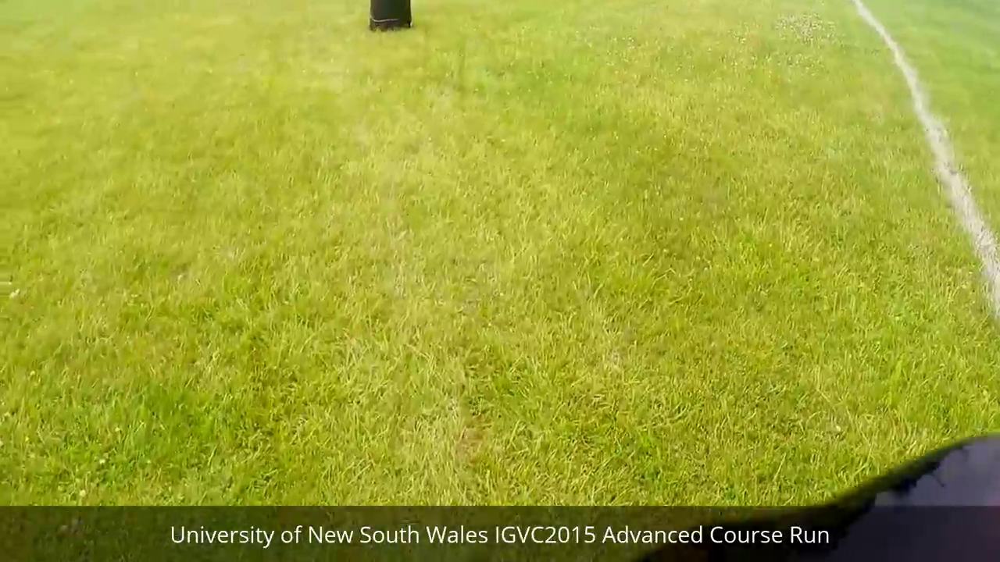

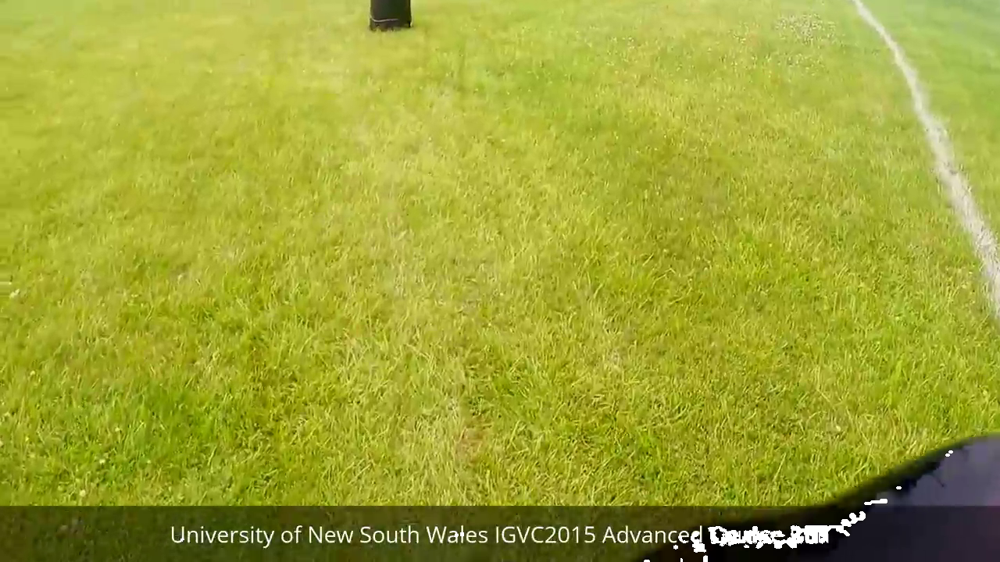

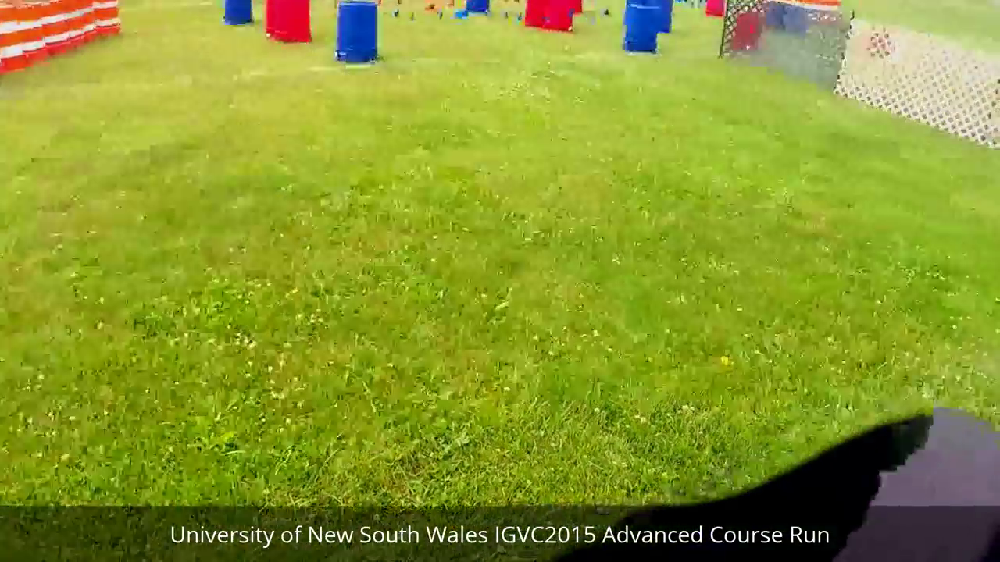

...

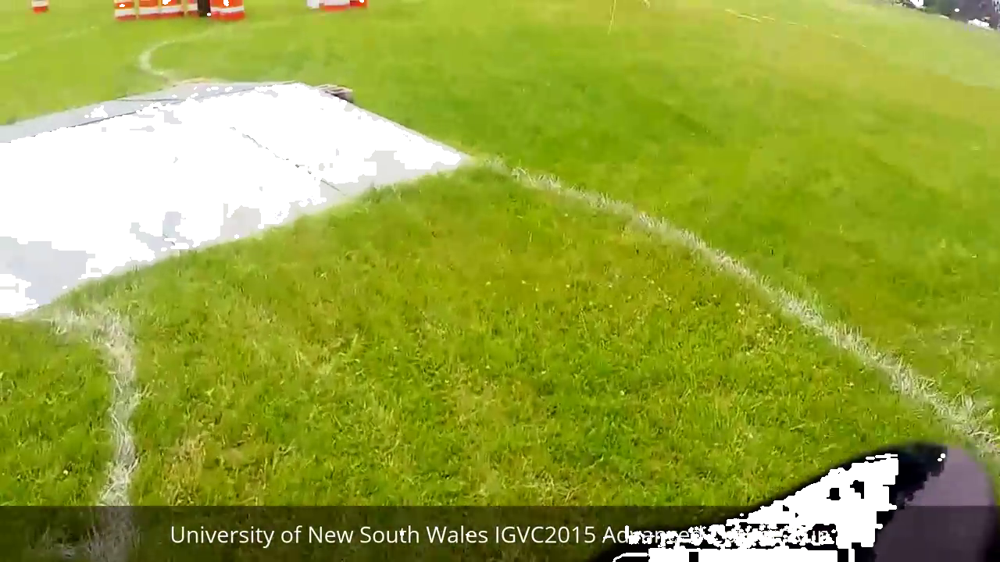

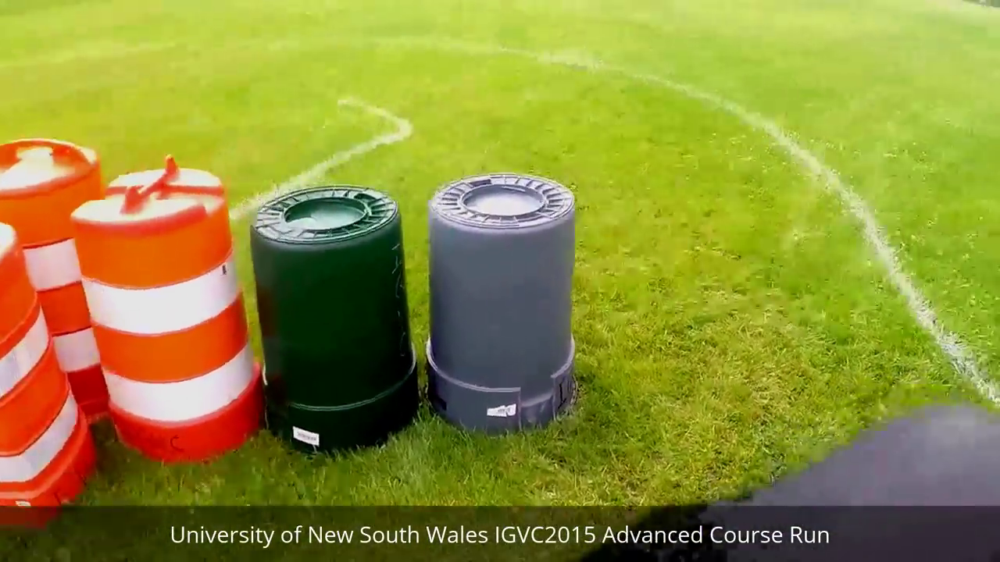

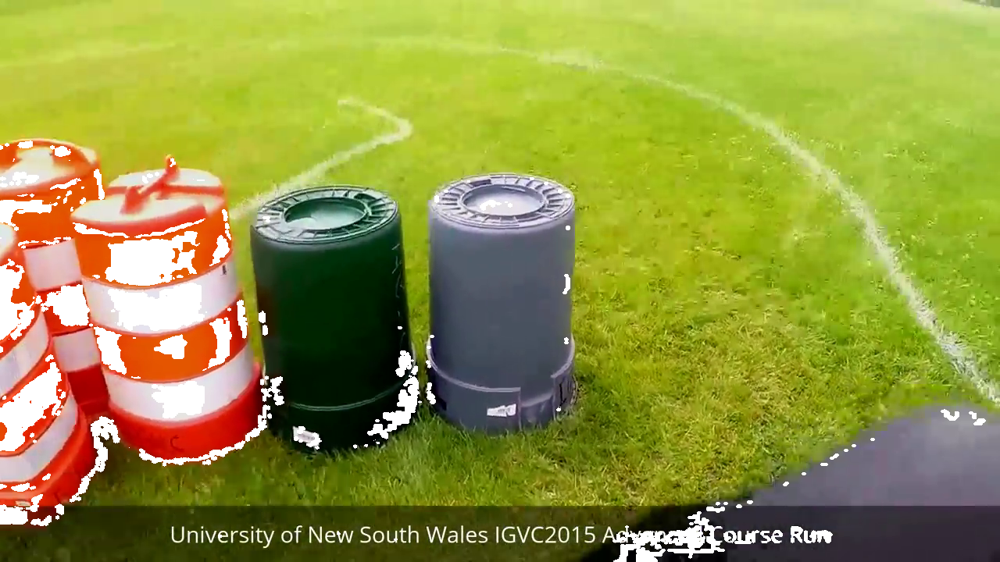

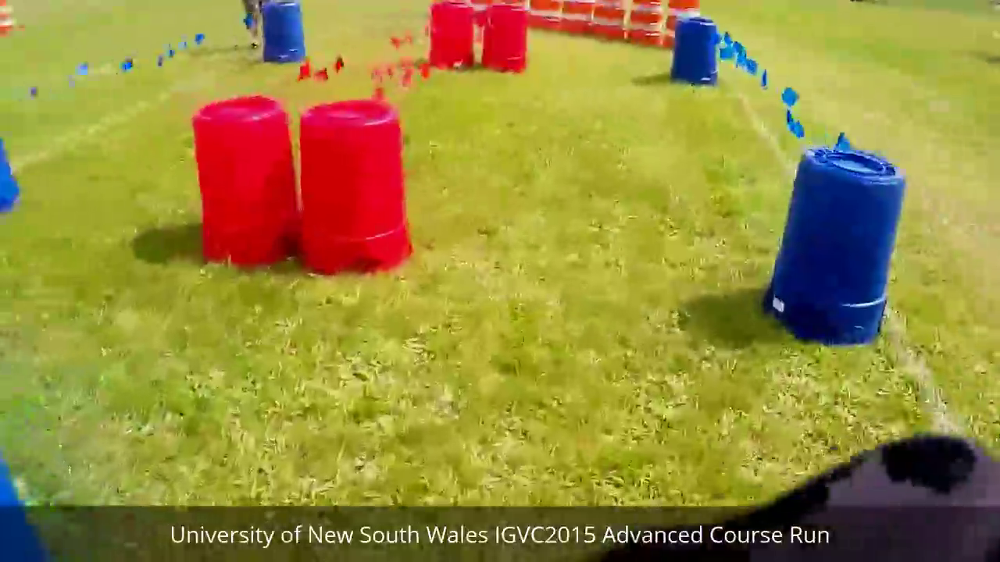

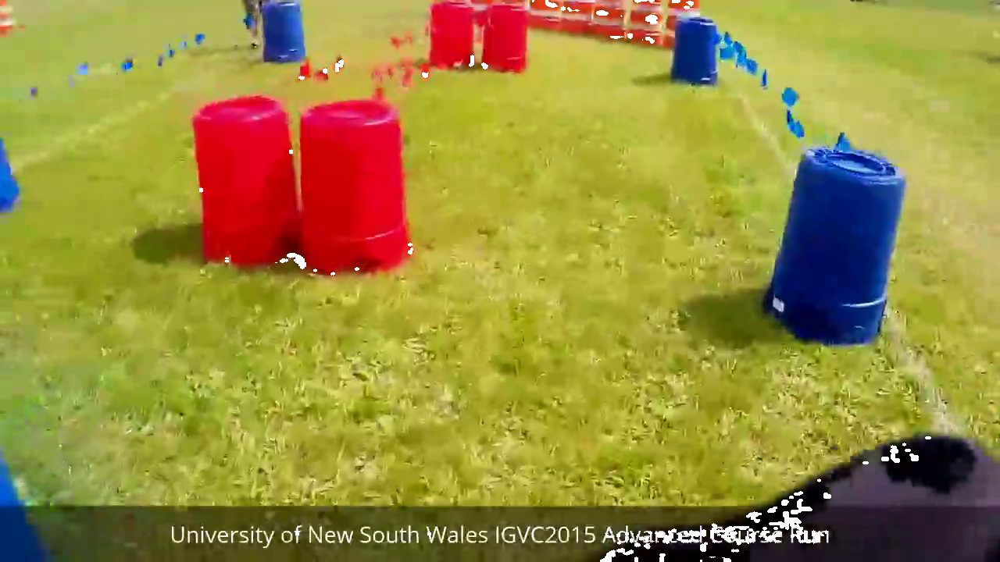

In [47]:
cap=cv2.VideoCapture("IGCV_video.mp4")

source=cv2.imread("orange_white_barrel.jpg")

source_hsv=cv2.cvtColor(source,cv2.COLOR_BGR2HSV)

hist=cv2.calcHist([source_hsv],[0,1],None,[180,256],[0,180,0,256])
cv2.normalize(hist,hist, alpha=0, beta=255, norm_type=cv2.NORM_MINMAX)

count=1

while(True):
  ret, frame = cap.read()
  # if frame is read correctly ret is True
  if not ret:
    break

  count+=1
#reading every 1000th frame
  if count%1000==0:
    target=frame

    target_hsv=cv2.cvtColor(target,cv2.COLOR_BGR2HSV)
    res=cv2.calcBackProject([target_hsv], [0,1], hist,[0,180,0,256], scale=1)

    disc = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    cv2.filter2D(res, -1, disc, res) #res is the matrix obtained after back projection

    ret,thresh = cv2.threshold(res,20,255,0)


    final = cv2.merge((thresh,thresh,thresh))

    result = cv2.bitwise_or(target, final)

    cv2_imshow(target)
    cv2_imshow(result)


cap.release()
cv2.destroyAllWindows()
